In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import warnings
import matplotlib.pyplot as plt
from collections import namedtuple 

from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler, RobustScaler
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
sns.set()

In [3]:
date = namedtuple('Date', 'month day')

In [4]:
#Функция вычисления центроидов всех кластеров 
def centroids(data, clusters):
    n = np.unique(clusters)
    dist = []
    for i in n:
        matrix = data.values[np.where(clusters == i)]
        dist.append(np.sum(matrix, axis=0) / matrix.shape[0])
    return np.array(dist)

#Расстояние между цетроидами кластеров (на вход матрица цетроидов) 
def cluster_dist(matrix):
    size = matrix.shape[0]
    av_dist = [sum((euclid(matrix[i], matrix[j]) for j in range(i, size))) for i in range(size)]
    return sum(av_dist)/ len(av_dist)

#Функция вычисления среднего расстояния между кластерами  
av_dist = lambda df, cl: cluster_dist(centroids(df, cl))

#Евклидово расстояние
euclid = lambda x, y: np.sqrt(np.sum((x - y)**2))

def plot(*args):
    plt.figure(figsize=(20, 6))
    for arg in args:
        plt.plot(arg.T)
    plt.title('Data Example')
    plt.show()

    
s1 = [pd.datetime(2017, 9, 1), pd.datetime(2018, 9, 1)]
d31 = [pd.datetime(2017, 12, 31), pd.datetime(2018, 12, 31)]
f14 = [pd.datetime(2018, 2, 14), pd.datetime(2019, 2, 14)]
f23 = [pd.datetime(2018, 2, 23), pd.datetime(2019, 2, 23)]
m8 = [pd.datetime(2018, 3, 8), pd.datetime(2019, 3, 8)]
allhol = [s1, d31, f14, f23, m8]
colors = ['b', 'g', 'r', 'm', 'c']    

def plot_clust(data, clusters, lines=100):
    centroid = centroids(data, clusters)
    n = np.unique(clusters)
    plt.figure(figsize=(20, 400))
    for i in n:
        plt.subplot(len(n), 1, i+1)
        plt.title(f'cluster {i}, {clusters[clusters==i].count()} items')
        for j, color in zip(allhol, colors):
            plt.axvline(j[0], c=color, label=j[0])
            plt.axvline(j[1], c=color, label=j[1])
        idx = np.where(clusters == i)[0][:lines]
        plt.plot(data.columns, centroid[i], c='red')
        for j in idx:
            plt.plot(data.T.iloc[:, j], c='black', alpha=0.1)

            
def metrics_values(data, clusters):
    metrics = {'Average Distance': av_dist(data, clusters),
                'Silhouette score': silhouette_score(data, clusters),
                'Calinski-Harabasz score': calinski_harabasz_score(data, clusters),
                'Davies bouldin score': davies_bouldin_score(data, clusters)}
    return metrics
    

# Extract dates

In [5]:
df = pd.read_csv(r'st_ts.txt', index_col='id')
df = np.log(1.1 + df[:60000]).T
df.index = pd.DatetimeIndex(df.index)
scale = StandardScaler()
sc_df = pd.DataFrame(scale.fit_transform(df).T, index=df.columns, columns=df.index)

In [6]:
seasons = {
    'winter': [12, 1, 2],
    'spring': [3, 4, 5],
    'summer': [6, 7, 8],
    'fall': [9, 10, 11]
}

dates = {
    '31d': date(12, 31),
    '1s': date(9, 1),
    '14f': date(2, 14),
    '23f': date(2, 23),
    '8m': date(3, 8)
}

In [7]:
def extract_dates_by_years(df, celeb, year, n_days):
    date = pd.datetime(year=year, month=dates[celeb].month, day=dates[celeb].day)
    sum1 = df[df.index <= date][-n_days:].sum()
    sum2 = df[df.index > date][:n_days].sum()
    return sum1 / sum2

def extract_seasons(df, season1, season2):
    sum1 = df[df.index.month.isin(seasons[season1])].sum()
    sum2 = df[df.index.month.isin(seasons[season2])].sum()
    return sum1 / sum2

def extract_seasons_by_years(df, year, season1, season2):
    if season1 == 'winter':
        sum1 = df[(df.index.month.isin(seasons[season1]))  & (df.index.year.isin([year, year-1])) & (df.index < f'{year}-03-01')].sum()
        sum2 = df[(df.index.month.isin(seasons[season2]))  & (df.index.year == year)].sum()
        return sum1 / sum2
    if season2 == 'winter':
        sum1 = df[(df.index.month.isin(seasons[season1]))  & (df.index.year == year)].sum()
        sum2 = df[(df.index.month.isin(seasons[season2]))  & (df.index.year.isin([year, year-1])) & (df.index < f'{year}-03-01')].sum()
        return sum1 / sum2
    sum1 = df[(df.index.month.isin(seasons[season1]))  & (df.index.year == year)].sum()
    sum2 = df[(df.index.month.isin(seasons[season2]))  & (df.index.year == year)].sum()
    return sum1 / sum2

In [8]:
day_feat = [extract_seasons(df, 'winter', 'summer'), extract_seasons(df, 'winter', 'spring'),
            extract_seasons(df, 'winter', 'fall'),
            extract_seasons(df, 'summer', 'spring'), extract_seasons(df, 'summer', 'fall'),
            extract_seasons(df, 'fall', 'spring'),
           extract_dates_by_years(df, '31d', 2017, 1), extract_dates_by_years(df, '31d', 2018, 2),
            extract_dates_by_years(df, '31d', 2018, 3), extract_dates_by_years(df, '31d', 2018, 4),
           extract_dates_by_years(df, '1s', 2017, 1), extract_dates_by_years(df, '1s', 2018, 2),
            extract_dates_by_years(df, '1s', 2018, 3), extract_dates_by_years(df, '1s', 2018, 4),
           extract_dates_by_years(df, '14f', 2018, 1), extract_dates_by_years(df, '14f', 2019, 1),
           extract_dates_by_years(df, '23f', 2018, 1), extract_dates_by_years(df, '23f', 2019, 1),
           extract_dates_by_years(df, '8m', 2018, 1), extract_dates_by_years(df, '8m', 2019, 1)]



In [9]:
df_dates = pd.DataFrame(day_feat).T
df_dates = pd.DataFrame(scale.fit_transform(df_dates), index=sc_df.index)

# Extract features by tsfresh

In [10]:
from tsfresh.feature_extraction import feature_calculators
from tsfresh.feature_extraction import extract_features, MinimalFCParameters
from tsfresh.utilities.distribution import MultiprocessingDistributor
from tsfresh.utilities.dataframe_functions import roll_time_series
from tsfresh import extract_relevant_features

In [11]:
fresh_df = pd.read_csv(r'fresh_format.csv', index_col='Unnamed: 0')
fresh_df1 = pd.read_csv(r'fresh_format1.csv', index_col='Unnamed: 0')
fresh_df2 = pd.read_csv(r'fresh_format2.csv', index_col='Unnamed: 0')

/Users/artem/anaconda3/lib/python3.7/site-packages/numpy/lib/arraysetops.py:568: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)


In [12]:
fresh_df1.shape,  fresh_df2.shape, fresh_df.shape

((16835832, 3), (16835832, 3), (33995430, 3))

In [13]:
fresh_df['time'] = pd.to_datetime(fresh_df['time'])
fresh_df1['time'] = pd.to_datetime(fresh_df1['time'])
fresh_df2['time'] = pd.to_datetime(fresh_df2['time'])

In [14]:
fresh_df = fresh_df[:105 * 60000]
fresh_df1 = fresh_df1[:52 * 60000]
fresh_df2 = fresh_df2[:52 * 60000]

In [48]:
fc_param = {
    'linear_trend': [{'attr': 'slope'}, {'attr': 'intercept'}],
#     'autocorrelation': [{'lag': 1}],

            
}
#     'spkt_welch_density': [{'coeff': 1}]
# # 'variance': None,
# # 'agg_autocorrelation': None,
#     'fft_aggregated': [{'aggtype': 'centroid'}, {'aggtype': 'variance'}, \
#                        {'aggtype': 'skew'}, {'aggtype': 'kurtosis'}],

In [49]:
fc_param1 = {
#     'linear_trend': [{'attr': 'slope'}, {'attr': 'intercept'}],
    'skewness': None,
    'kurtosis': None,
    'fft_coefficient': [{'coeff':3, 'attr': 'abs'}, {'coeff':3, 'attr': 'angle'},\
                        {'coeff':2, 'attr': 'abs'}, {'coeff':2, 'attr': 'angle'},\
                        {'coeff':1, 'attr': 'abs'}, {'coeff':1, 'attr': 'angle'},],
    'cwt_coefficients': [{'widths': range(1, 20), 'coeff': 1, 'w': 1}]
    
            
}

In [50]:
X = extract_features(fresh_df, column_id='id', column_sort='time',\
                  default_fc_parameters=fc_param1)

X1 = extract_features(fresh_df1, column_id='id', column_sort='time',\
                  default_fc_parameters=fc_param)

X2 = extract_features(fresh_df2, column_id='id', column_sort='time',\
                  default_fc_parameters=fc_param)

Feature Extraction: 100%|██████████| 10/10 [00:35<00:00,  3.58s/it]


In [51]:
# X1['value__autocorrelation__lag_1'] = X1['value__autocorrelation__lag_1'].fillna(X1['value__autocorrelation__lag_1'].median())
# X2['value__autocorrelation__lag_1'] = X2['value__autocorrelation__lag_1'].fillna(X2['value__autocorrelation__lag_1'].median())
# X1['value__autocorrelation__lag_2'] = X1['value__autocorrelation__lag_2'].fillna(X1['value__autocorrelation__lag_2'].median())
# X2['value__autocorrelation__lag_2'] = X2['value__autocorrelation__lag_2'].fillna(X2['value__autocorrelation__lag_2'].median())

In [52]:
# X['ratio_value__autocorrelation__lag_1'] = X1['value__autocorrelation__lag_1'] / X2['value__autocorrelation__lag_1']
# X['ratio_value__autocorrelation__lag_1'] = X['ratio_value__autocorrelation__lag_1'].replace([np.inf, -np.inf], 0)
# X['ratio_value__autocorrelation__lag_2'] = X1['value__autocorrelation__lag_2'] / X2['value__autocorrelation__lag_2']
# X['ratio_value__autocorrelation__lag_2'] = X['ratio_value__autocorrelation__lag_2'].replace([np.inf, -np.inf], 0)
# X1 = X1.drop('value__autocorrelation__lag_1', axis=1)
# X2 = X2.drop('value__autocorrelation__lag_1', axis=1)
# X1 = X1.drop('value__autocorrelation__lag_2', axis=1)
# X2 = X2.drop('value__autocorrelation__lag_2', axis=1)

In [53]:
# X['ratio_value__linear_trend__attr_"intercept"'] = X1['value__linear_trend__attr_"intercept"'] / X2['value__linear_trend__attr_"intercept"']
# X['ratio_value__linear_trend__attr_"slope"'] = X1['value__linear_trend__attr_"slope"'] / X2['value__linear_trend__attr_"slope"']
# X['ratio_value__linear_trend__attr_"intercept"'] = X['ratio_value__linear_trend__attr_"intercept"'].replace([np.inf, -np.inf], 0)
# X['ratio_value__linear_trend__attr_"slope"'] = X['ratio_value__linear_trend__attr_"slope"'].replace([np.nan, np.inf, -np.inf], 0)
# X1 = X1.drop('value__linear_trend__attr_"intercept"', axis=1)
# X2 = X2.drop('value__linear_trend__attr_"slope"', axis=1)

In [54]:
X2.columns = [i + '2' for i in X2.columns]
X.columns = [i + 'full' for i in X.columns]

In [55]:
dffeat = X1.join(X2)
full_dffeat = dffeat.join(X)

In [57]:
df_feats = pd.DataFrame(scale.fit_transform(full_dffeat), index=full_dffeat.index, columns=full_dffeat.columns)

In [58]:
df_feats

,"value__linear_trend__attr_""intercept""","value__linear_trend__attr_""slope""","value__linear_trend__attr_""intercept""2","value__linear_trend__attr_""slope""2","value__cwt_coefficients__widths_range(1, 20)__coeff_1__w_1full","value__fft_coefficient__coeff_1__attr_""abs""full","value__fft_coefficient__coeff_1__attr_""angle""full","value__fft_coefficient__coeff_2__attr_""abs""full","value__fft_coefficient__coeff_2__attr_""angle""full","value__fft_coefficient__coeff_3__attr_""abs""full","value__fft_coefficient__coeff_3__attr_""angle""full",value__kurtosisfull,value__skewnessfull
id,,,,,,,,,,,,,
0,-0.096841,0.224112,0.472778,-0.437204,-0.516757,-0.694121,0.969016,-0.970588,0.866875,-0.396558,-1.697055,-0.443722,-0.769650
1,-0.118763,0.134478,0.355641,-0.261097,-0.517652,-0.618735,0.822784,-1.062756,-1.641732,-1.731666,1.597894,-0.364872,-0.336898
2,0.261808,0.173208,0.883057,-1.146765,-0.371605,-0.497530,-1.888219,-0.527463,-1.003891,-0.777601,-0.052027,-0.346869,-0.122100
3,1.065003,-0.879323,0.280865,-0.637573,0.579299,-1.395320,-0.950221,-0.463684,-0.770339,-1.586913,-0.866322,1.090626,1.392355
4,0.463651,-0.849469,-2.132396,2.014914,-1.832211,0.818282,-0.091044,1.161236,0.302917,1.540231,0.258103,-0.000997,0.583645
...,...,...,...,...,...,...,...,...,...,...,...,...,...
34359739425,1.356355,-0.737436,0.670106,-1.368332,0.240100,0.049750,-1.393202,0.222577,-0.172562,-0.564457,-1.579530,-0.269162,0.048863
34359739426,1.852743,-1.649324,0.486386,-1.024774,2.724273,-0.727944,-1.083879,0.075180,-0.608524,-0.948283,-0.297927,-0.286803,0.122340
34359739427,0.368091,-0.011259,-0.169934,-0.187740,3.898865,-1.321080,0.789439,-1.128355,-0.179287,-0.674022,-0.786657,2.560176,2.491824


# Merge

In [59]:
features = df_dates.join(df_feats)

In [60]:
# med = features['ratio_value__autocorrelation__lag_1'].median()
# features['ratio_value__autocorrelation__lag_1'].replace(features['ratio_value__autocorrelation__lag_1']>5,med,inplace=True)


In [61]:
features.head()

,0,1,2,3,4,5,6,7,8,9,...,"value__linear_trend__attr_""slope""2","value__cwt_coefficients__widths_range(1, 20)__coeff_1__w_1full","value__fft_coefficient__coeff_1__attr_""abs""full","value__fft_coefficient__coeff_1__attr_""angle""full","value__fft_coefficient__coeff_2__attr_""abs""full","value__fft_coefficient__coeff_2__attr_""angle""full","value__fft_coefficient__coeff_3__attr_""abs""full","value__fft_coefficient__coeff_3__attr_""angle""full",value__kurtosisfull,value__skewnessfull
id,,,,,,,,,,,,,,,,,,,,,
0,-0.244808,-0.159302,-0.137593,-0.088250,-0.153779,-0.221556,0.123865,7.940769,0.904771,0.721796,...,-0.437204,-0.516757,-0.694121,0.969016,-0.970588,0.866875,-0.396558,-1.697055,-0.443722,-0.769650
1,-0.126713,-0.562031,-0.533509,-0.712947,-0.520519,-0.269833,-0.400443,1.897457,-0.225717,-0.233574,...,-0.261097,-0.517652,-0.618735,0.822784,-1.062756,-1.641732,-1.731666,1.597894,-0.364872,-0.336898
2,0.540010,0.467197,-0.223656,-0.342888,-0.683982,0.355741,-0.658129,1.897457,-0.225717,0.260363,...,-1.146765,-0.371605,-0.497530,-1.888219,-0.527463,-1.003891,-0.777601,-0.052027,-0.346869,-0.122100
3,1.497919,2.656749,-0.040144,0.320512,-0.884833,1.818536,-0.400443,-0.736500,-0.839559,-0.889768,...,-0.637573,0.579299,-1.395320,-0.950221,-0.463684,-0.770339,-1.586913,-0.866322,1.090626,1.392355
4,-1.212413,0.195348,-0.765485,5.501690,1.275634,0.835419,-0.400443,-0.198103,-0.225717,-0.233574,...,2.014914,-1.832211,0.818282,-0.091044,1.161236,0.302917,1.540231,0.258103,-0.000997,0.583645


# Clustering

25    3509
38    3125
12    3078
2     2453
36    2363
4     2206
1     2178
32    2099
28    2090
11    1858
31    1768
13    1763
18    1685
7     1612
17    1567
0     1526
8     1522
24    1522
10    1494
15    1480
14    1473
16    1384
26    1362
9     1267
21    1234
37    1213
23    1194
20    1175
19    1162
3     1151
30     878
35     869
39     858
33     705
22     690
5      654
34     628
27     560
6      549
29      96
dtype: int64


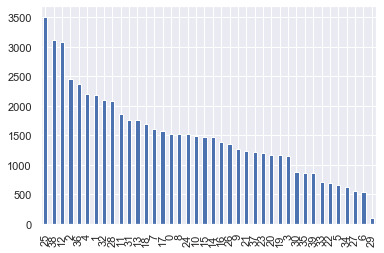

CPU times: user 696 ms, sys: 149 ms, total: 845 ms
Wall time: 21.8 s


In [62]:
%%time
clusters = pd.Series(KMeans(n_clusters=40, random_state=42, n_jobs = -1).fit_predict(features), index = sc_df.index)

print(clusters.value_counts())
clusters.value_counts().plot.bar()
plt.show()

CPU times: user 6.6 s, sys: 399 ms, total: 7 s
Wall time: 7.59 s


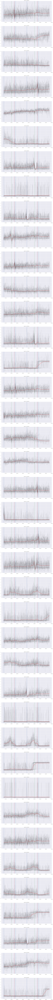

In [63]:
%%time
plot_clust(sc_df, clusters, 40)

In [139]:
print(metrics_values(sc_df, clusters))

{'Average Distance': 95.03909928655335, 'Silhouette score': -0.049669745828733826, 'Calinski-Harabasz score': 230.67951245093238, 'Davies bouldin score': 10.452852948045313}


In [33]:
test = sc_df[clusters==12]

In [ ]:
extract_dates_by_years(test, )